In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import os

import warnings
warnings.filterwarnings("ignore")

In [ ]:
def arrange_data(data):
  # This function arranges the data

  collist = list(data.loc[0])
  collist[0] = "time"
  for i in range(1, len(collist)):
    idx = collist[i].find("( µg/m3 )")
    collist[i] = collist[i][:idx-1]
  data.columns = collist

  data = data.iloc[1:] # The first row indicates columns
  data = data.set_index("time")
  for i in data.columns:
    data[i] = data[i].str.replace(".", "") # Dot used to indicate digits
    data[i] = data[i].str.replace(",", ".") # Comma used to indicate decimals

  data = data.replace('-',np.NaN)
  for i in data.columns:
    data[i] = data[i].astype(float)

  data = data.mask(data>350, np.nan)
  data = data.mask(data<0, np.nan)

  data["date"] = data.index.date
  return data

Arnavutkoy.xlsx
Bagcilar.xlsx
Basaksehir_MTHM.xlsx
Besiktas.xlsx
Catladikapi.xlsx
Esenler.xlsx
Goztepe.xlsx
Kadikoy.xlsx
Kandilli_MTHM.xlsx
Kartal.xlsx
Maslak.xlsx
Sancaktepe.xlsx
Sariyer.xlsx
Aksaray.xlsx
Selimiye.xlsx
Silivri_MTHM.xlsx
Sultangazi_MTHM.xlsx
Sile_MTHM.xlsx
Umraniye_MTHM.xlsx
Uskudar.xlsx
Uskudar_MTHM.xlsx


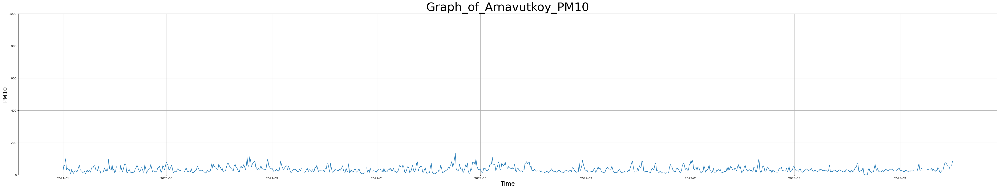

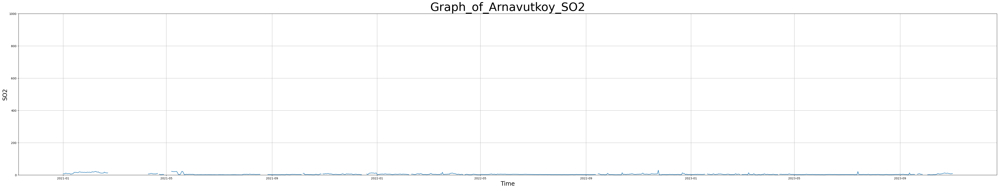

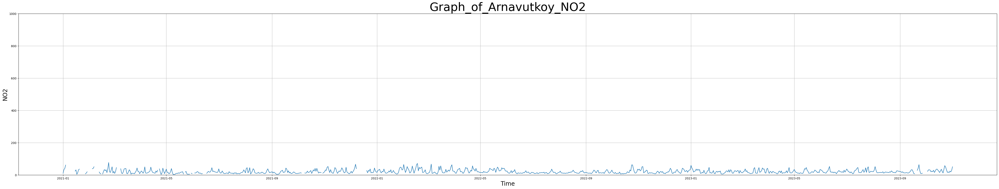

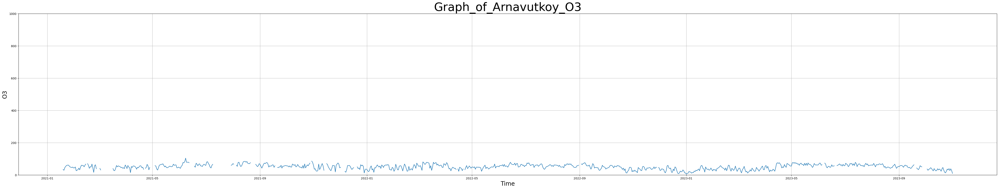

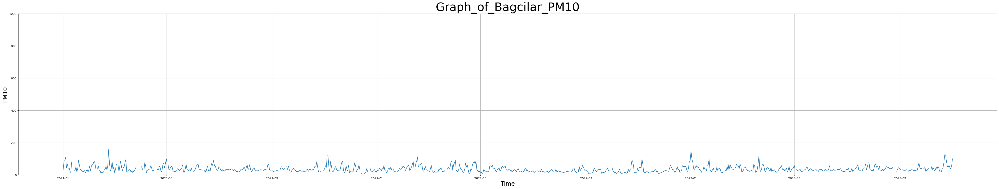

...

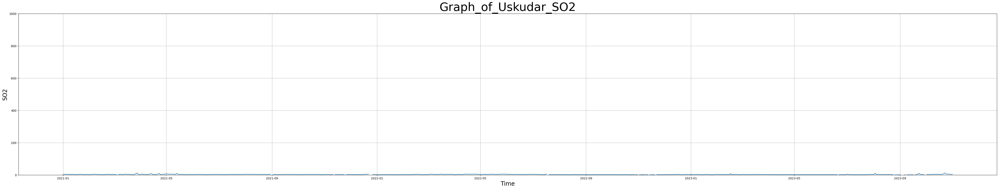

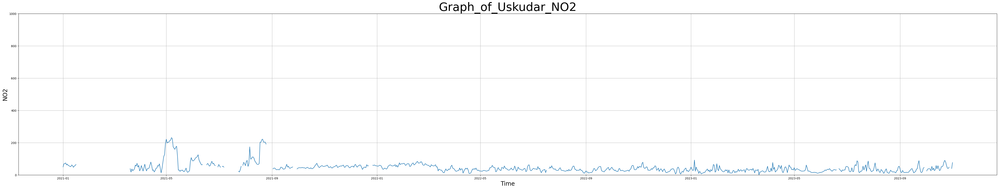

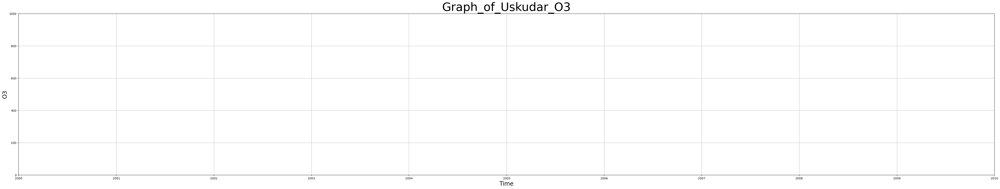

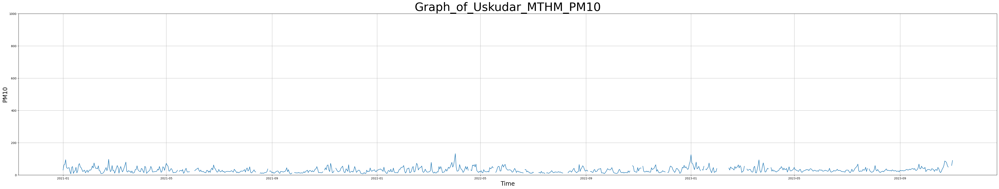

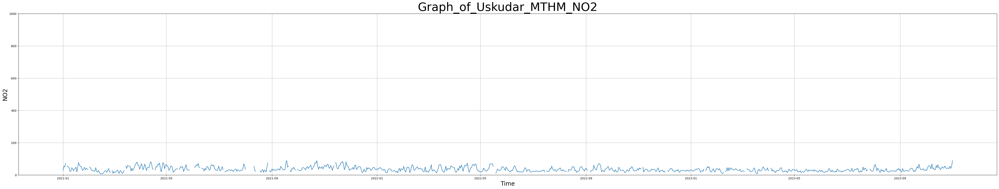

In [ ]:
path = "/content/drive/MyDrive/PROJ201/Air_Data/"
for i in os.listdir(path):
  print(i) # to track the progress
  data = pd.read_excel(path+i)
  data = arrange_data(data)

  for param in data.columns[:-1]:
    # data.columns[1:-1] --> to drop time and date columns

    data2 = data[["date", param]].groupby('date').mean() # Getting mean value daily

    isnull_count = data.groupby('date').apply(lambda x: 100*x[param].isnull().sum()/len(x))
    # Acquiring the percentage of missing values per day
    data2 = pd.merge(pd.DataFrame(isnull_count, columns=["nan_ratio"]), data2, on = "date")
    data2["time"] = data2.index
    data2 = data2.mask(data2.nan_ratio>= 30, np.nan)
    # Selecting for less than 30 percent as valid values


    f, ax = plt.subplots(figsize = (60,10))
    try:
      data2[param].plot(ax=ax, grid = True, title = "Graph_of_"+i[:-5]+"_"+param)
      ax.set_xlabel("Time").set_size(20)
      ax.set_ylabel(param).set_size(20)
      ax.title.set_size(40)
      ax.set_ylim((0,1000)) # y axis limit
      plt.savefig("/content/drive/MyDrive/PROJ201/Graphics/"+i[:-5]+"_"+param)
      # i[:-5] --> dropping .xlsx in the excel file name

      fig = px.line(data2, x="time", y=param, title="Graph_of_"+i[:-5]+"_"+param)
      fig.write_html("/content/drive/MyDrive/PROJ201/Graphics_HTML/"+i[:-5]+"_"+param+".html")
      # i[:-5] --> dropping .xlsx in the excel file name

      data2[param].to_csv("/content/drive/MyDrive/PROJ201/Arranged_Air_Data/"+i[:-5]+"_"+param+".csv")
    except ValueError: # if all of the sample is empty (the station does not measure that parameter)
      continue

[]

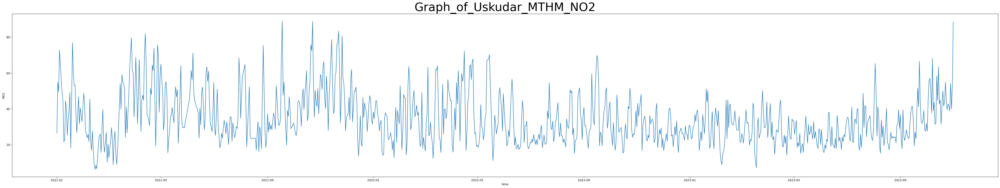

In [ ]:
f, ax = plt.subplots(figsize = (60,10))
sns.lineplot(x="time", y=param, data=data2, ax=ax).set_title("Graph_of_"+i[:-5]+"_"+param, fontsize=40)
plt.plot()

[]

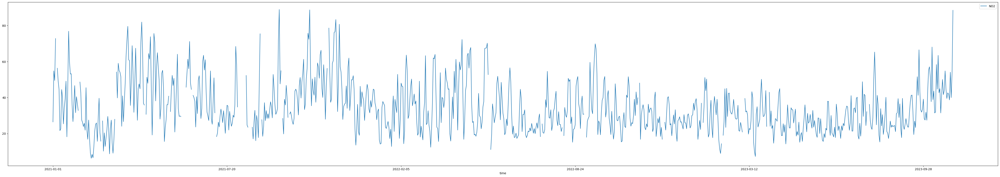

In [ ]:
f, ax = plt.subplots(figsize = (60,10))
data2.plot(x="time", y=param, ax=ax)
plt.plot()

In [ ]:
data2.describe()

,nan_ratio,NO2
count,991.000000,991.000000
mean,1.328624,34.784325
std,4.489273,14.308349
min,0.000000,6.296364
25%,0.000000,24.099583
50%,0.000000,31.615714
75%,0.000000,43.114583
max,29.166667,88.927826
